In [69]:
import tensorflow as tf
from tensorflow.keras import layers, models, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import numpy as np

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split

In [70]:
IMG_ROWS = 28
IMG_COLS = 28
NUM_CLASSES = 10
VAL_SIZE = 0.2
RANDOM_STATE = 99
BATCH_SIZE = 100

In [71]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

In [72]:
# แปลงชนิดข้อมูลเป็น float32 เพื่อให้รองรับค่าทศนิยม
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# ทำ Scaling โดยการหารด้วย 255
x_train /= 255.0
x_test /= 255.0

In [73]:
y_train = tf.keras.utils.to_categorical(y_train, NUM_CLASSES)
y_test = tf.keras.utils.to_categorical(y_test, NUM_CLASSES)

y_train[0]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])

In [74]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=VAL_SIZE, random_state=RANDOM_STATE)

In [75]:
print(f"x_train shape {x_train.shape}")
print(f"y_train shape {y_train.shape}")
print(f"x_val shape {x_val.shape}")
print(f"y_val shape {y_val.shape}")
print(f"x_test shape {x_test.shape}")
print(f"y_test shape {y_test.shape}")

x_train shape (40000, 32, 32, 3)
y_train shape (40000, 10)
x_val shape (10000, 32, 32, 3)
y_val shape (10000, 10)
x_test shape (10000, 32, 32, 3)
y_test shape (10000, 10)


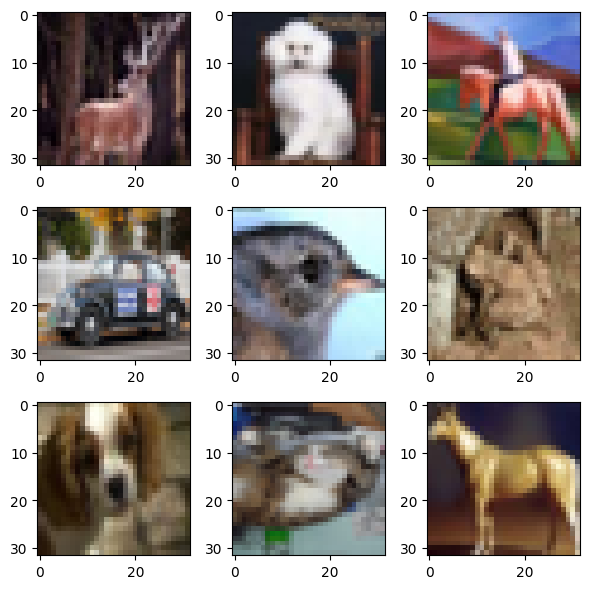

In [76]:
# กำหนดขนาดรูปภาพ
plt.figure(figsize=(6, 6))

for i in range(9):
    # สร้าง subplot ในตารางขนาด 3x3 ตำแหน่งที่ i+1
    plt.subplot(3, 3, i + 1)

    # แสดงรูปภาพ
    plt.imshow(x_train[i])

plt.tight_layout() # จัด layout ให้สวยงามอัตโนมัติ
plt.show()

Baseline Model
นิยาม Model, Compile Model และ Train Model โดยยังไม่ใช้เทคนิค Regularization ดังต่อไปนี้

In [77]:
input_shape=(32, 32, 3)
inputs = Input(shape=input_shape)

# Feature Extraction Layers
x = layers.Conv2D(32, (3, 3), activation='relu')(inputs)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = layers.Flatten()(x)
x = layers.Dense(64, activation='relu')(x)

# กำหนด Output Layer
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

# ประกาศว่าโมเดลนี้มีจุดเริ่มต้น (inputs) และจุดสิ้นสุด (outputs)
model = models.Model(inputs=inputs, outputs=outputs)

In [78]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [79]:
EPOCHS = 20

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.3276 - loss: 1.8380 - val_accuracy: 0.4980 - val_loss: 1.3790
Epoch 2/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5273 - loss: 1.3243 - val_accuracy: 0.5827 - val_loss: 1.1916
Epoch 3/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5884 - loss: 1.1664 - val_accuracy: 0.6165 - val_loss: 1.0864
Epoch 4/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6329 - loss: 1.0537 - val_accuracy: 0.6483 - val_loss: 1.0177
Epoch 5/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6547 - loss: 0.9874 - val_accuracy: 0.6618 - val_loss: 0.9743
Epoch 6/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6794 - loss: 0.9185 - val_accuracy: 0.6572 - val_loss: 0.9874
Epoch 7/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6974 - loss: 0.8705 - val_accuracy: 0.6634 - val_loss: 0.9684
Epoch 8/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7113 - loss: 0.8355 - val_accuracy: 0.

In [80]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

Image Augmentation
ปัญหา Overfitting ของ Model สามารถแก้ได้ด้วยการเพิ่มจำนวน Data ในการ Train แต่ด้วย Dataset ของเรามีจำกัด ดังนั้นในบางกรณีเราจึงต้องสังเคราะห์ Data ขึ้นมาเอง ในกรณีของ Data แบบ Image เราสามารถใช้เทคนิคอย่างเช่นการหมุนภาพ การเลื่อนภาพ และการกลับภาพ ฯลฯ ซึ่งนอกจากเป็นการขยายจำนวน Data แล้ว Image Augmentation ยังช่วยเพิ่มความหลากหลายของภาพที่จะนำไป Train อีกด้วย

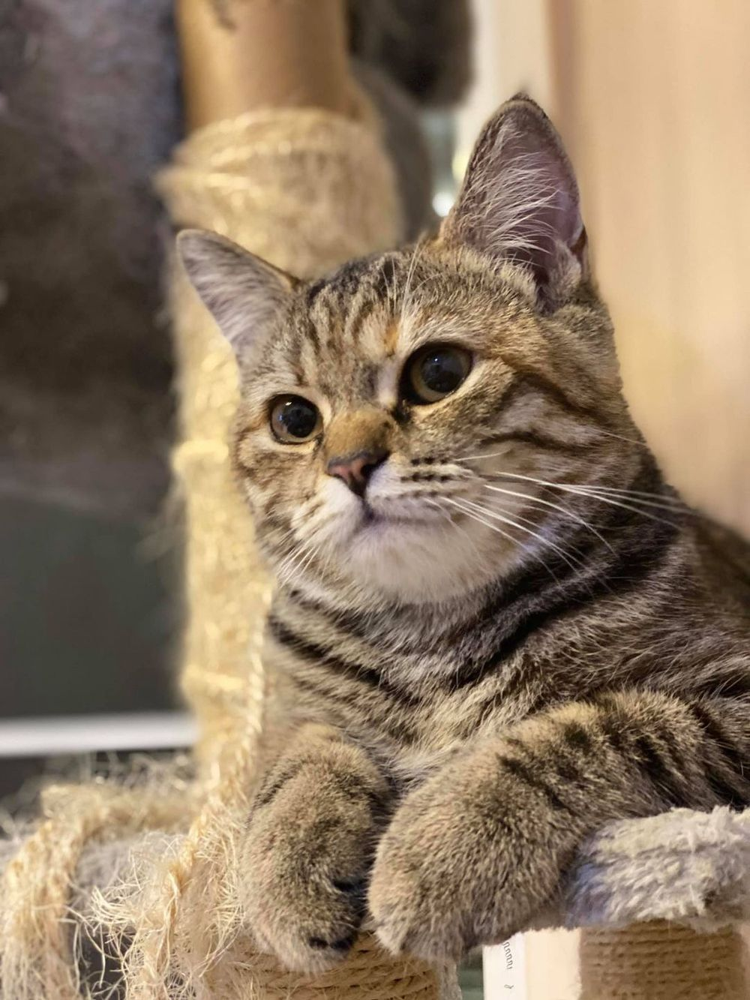

In [81]:
cat = load_img('cat.jpg')
cat

In [82]:
img_array = img_to_array(cat)
img_array.shape

(1333, 1000, 3)

In [83]:
# เพิ่มมิติของ Batch (จาก (H, W, C) -> (1, H, W, C))
img_batch = tf.expand_dims(img_array, 0)
img_batch.shape

TensorShape([1, 1333, 1000, 3])

In [84]:
# height_factor=0.2 เลื่อนขึ้น/ลงได้ไม่เกิน 20% ของความสูงภาพ
vertical_shift_layer = tf.keras.layers.RandomTranslation(
    height_factor=0.2,
    width_factor=0.0, # ไม่มีการเลื่อนในแนวนอน
    fill_mode='reflect'
)

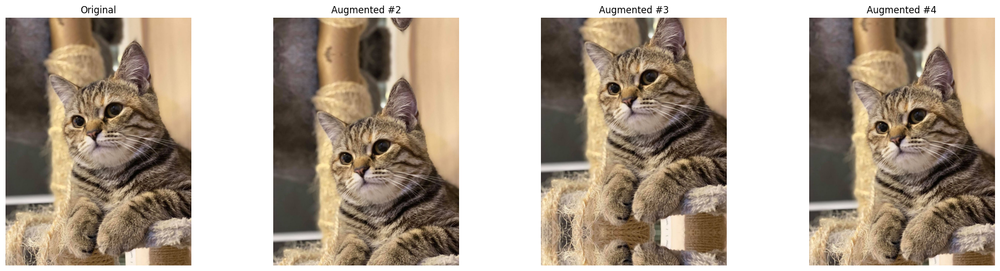

In [85]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

# แสดงภาพที่ผ่าน Augmentation 3 ครั้ง
for i in range(1, 4):
    # ส่งภาพ (ที่เป็น Batch) ผ่าน Layer ที่เราสร้างไว้
    augmented_batch = vertical_shift_layer(img_batch)

    # แปลง Tensor กลับเป็นภาพที่แสดงผลได้ (Numpy array ชนิด uint8)
    # และเลือกภาพแรกจาก Batch (index [0])
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented #{i+1}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [86]:
horizontal_shift_layer = tf.keras.layers.RandomTranslation(
    height_factor=0.0, # ไม่มีการเลื่อนในแนวตั้ง
    width_factor=0.2,
    fill_mode='reflect'
)

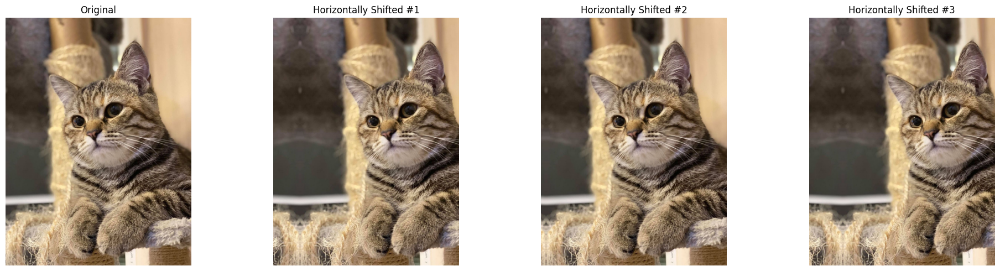

In [87]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = horizontal_shift_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Horizontally Shifted #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

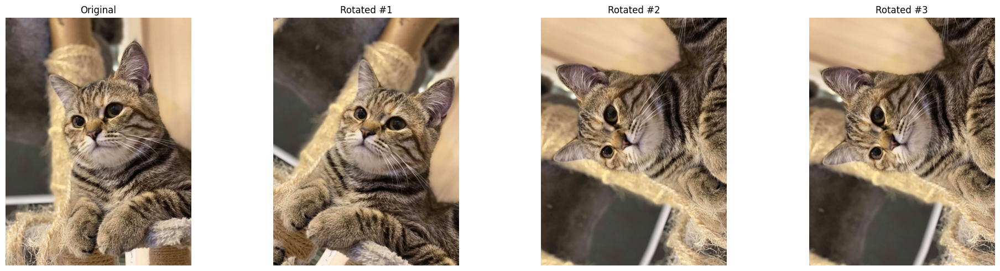

In [88]:
rotation_layer = tf.keras.layers.RandomRotation(
    factor=0.2,  # Randomly rotate by a factor of up to 20% of 360 degrees (72 degrees)
    fill_mode='reflect'
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = rotation_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Rotated #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

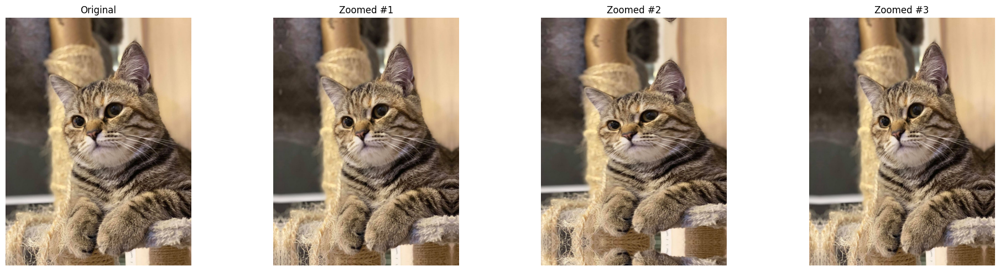

In [89]:
zoom_layer = tf.keras.layers.RandomZoom(
    height_factor=0.3, # Randomly zoom in/out by up to 30% vertically
    width_factor=0.3,  # Randomly zoom in/out by up to 30% horizontally
    fill_mode='reflect'
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = zoom_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Zoomed #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

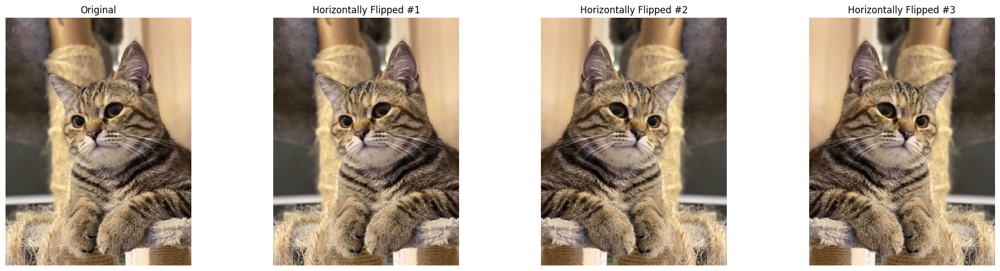

In [90]:
horizontal_flip_layer = tf.keras.layers.RandomFlip(
    mode='horizontal'  # Randomly flip images horizontally
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = horizontal_flip_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Horizontally Flipped #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

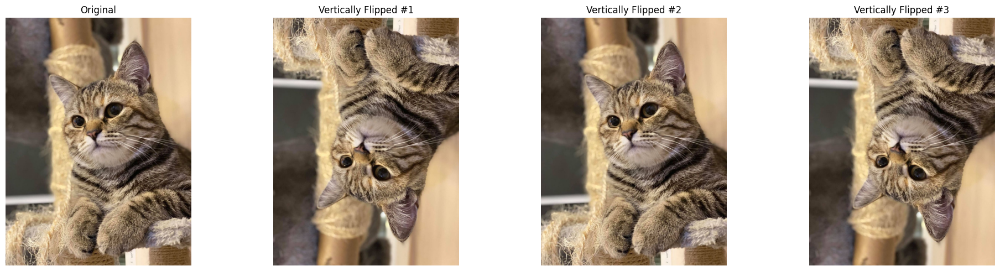

In [91]:
vertical_flip_layer = tf.keras.layers.RandomFlip(
    mode='vertical'  # Randomly flip images vertically
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = vertical_flip_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Vertically Flipped #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

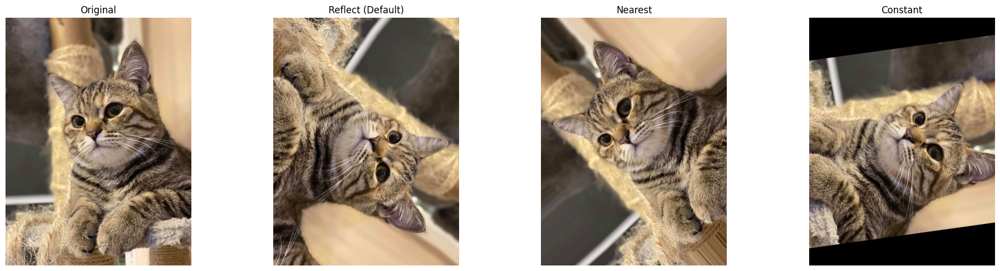

In [92]:
# reflect ค่า Default ของ API
reflect_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='reflect')

nearest_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='nearest')

# 'constant' (เติมด้วยค่าคงที่ ในที่นี้คือสีดำ)
constant_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='constant')

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# แสดงภาพต้นฉบับ
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

# แสดงภาพที่เติมขอบแบบต่างๆ
titles = ['Reflect (Default)', 'Nearest', 'Constant']
layers = [reflect_layer, nearest_layer, constant_layer]

for i in range(3):
    augmented_batch = layers[i](img_batch, training=True) # training=True เพื่อให้เกิดการสุ่ม
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i+1].imshow(augmented_image)
    ax[i+1].set_title(titles[i])
    ax[i+1].axis('off')

plt.tight_layout()
plt.show()

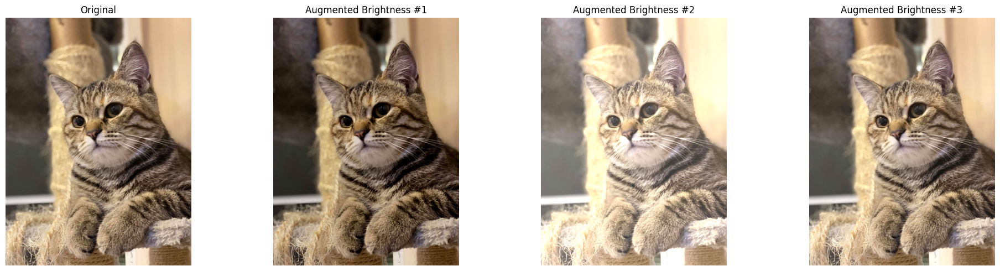

In [68]:
# Layer สำหรับ Random Brightness
brightness_layer = tf.keras.layers.RandomBrightness(factor=0.4)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = brightness_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Brightness #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [92]:
# สร้าง Layer สำหรับ Random Contrast
contrast_layer = tf.keras.layers.RandomContrast(factor=0.4)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = contrast_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Contrast #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [92]:
# สร้าง Layer สำหรับ Random Saturation
saturation_layer = tf.keras.layers.RandomSaturation(factor=0.3)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = saturation_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Saturation #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [92]:
# สร้าง Layer สำหรับ Random Hue
hue_layer = tf.keras.layers.RandomHue(factor=0.3)

# --- Plot ผลลัพธ์ ---
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = hue_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Hue #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [92]:
input_shape=(32, 32, 3)
inputs = Input(shape=input_shape)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

# นำ Input ไปผ่าน Augmentation Layers ก่อน
x = data_augmentation(inputs)

# Feature Extraction Layers
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)

# กำหนด Output Layer
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)

# ประกาศว่าโมเดลนี้มีจุดเริ่มต้น (inputs) และจุดสิ้นสุด (outputs)
model = models.Model(inputs=inputs, outputs=outputs)

In [92]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

In [93]:
EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.8563 - loss: 0.4165 - val_accuracy: 0.6935 - val_loss: 1.0104
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8625 - loss: 0.3970 - val_accuracy: 0.6957 - val_loss: 1.0446
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8769 - loss: 0.3658 - val_accuracy: 0.6996 - val_loss: 1.0500
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8761 - loss: 0.3605 - val_accuracy: 0.6882 - val_loss: 1.1153
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8886 - loss: 0.3353 - val_accuracy: 0.6882 - val_loss: 1.1550
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8931 - loss: 0.3136 - val_accuracy: 0.6824 - val_loss: 1.1966
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8989 - loss: 0.2945 - val_accuracy: 0.6900 - val_loss: 1.1943
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9069 - loss: 0.2720 - val_accu

In [94]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [95]:
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 3s - 8ms/step - accuracy: 0.6497 - loss: 5.1278

Test accuracy = 0.6496999859809875


In [96]:
input_shape = (32, 32, 3)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

inputs = Input(shape=input_shape)
x = data_augmentation(inputs)

# Feature Extraction Layers
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)

# ตำแหน่งที่เพิ่ม Dropout
x = tf.keras.layers.Dropout(0.2)(x)

outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = models.Model(inputs=inputs, outputs=outputs)

In [97]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [98]:
EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.2481 - loss: 2.0254 - val_accuracy: 0.4170 - val_loss: 1.6025
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4234 - loss: 1.5967 - val_accuracy: 0.5020 - val_loss: 1.3767
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.4584 - loss: 1.5051 - val_accuracy: 0.5281 - val_loss: 1.3033
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4878 - loss: 1.4165 - val_accuracy: 0.5601 - val_loss: 1.2307
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5039 - loss: 1.3758 - val_accuracy: 0.5844 - val_loss: 1.1583
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5241 - loss: 1.3280 - val_accuracy: 0.5810 - val_loss: 1.1788
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.5304 - loss: 1.3125 - val_accuracy: 0.5762 - val_loss: 1.1980
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5459 - loss: 1.2829 - val_accu

In [99]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [100]:
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 1s - 4ms/step - accuracy: 0.7054 - loss: 0.8784

Test accuracy = 0.7053999900817871


SyntaxError: invalid character '×' (U+00D7) (ipython-input-1062210258.py, line 1)

# Label Smooth

In [105]:
input_shape = (32, 32, 3)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

inputs = Input(shape=input_shape)
x = data_augmentation(inputs)

x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = models.Model(inputs=inputs, outputs=outputs)

In [106]:
# สร้าง Loss Function object พร้อมกำหนดค่า Label Smoothing
loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1)

model.compile(optimizer='adam', loss=loss_function, metrics=['accuracy'])

model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [107]:
EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.2507 - loss: 2.0790 - val_accuracy: 0.4432 - val_loss: 1.6989
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4225 - loss: 1.7528 - val_accuracy: 0.4878 - val_loss: 1.6259
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.4637 - loss: 1.6719 - val_accuracy: 0.5237 - val_loss: 1.5607
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4805 - loss: 1.6366 - val_accuracy: 0.5660 - val_loss: 1.4740
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5087 - loss: 1.5844 - val_accuracy: 0.5790 - val_loss: 1.4415
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.5232 - loss: 1.5649 - val_accuracy: 0.5937 - val_loss: 1.4208
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5307 - loss: 1.5480 - val_accuracy: 0.6021 - val_loss: 1.4087
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5385 - loss: 1.5319 - val_accu

In [108]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [109]:
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 1s - 4ms/step - accuracy: 0.6955 - loss: 1.2330

Test accuracy = 0.6955000162124634
